# VRSJ AC 2020
Plot


Masahiro Furukawa

Aug 30, 2020

Opti Track Coordination from Hirayama

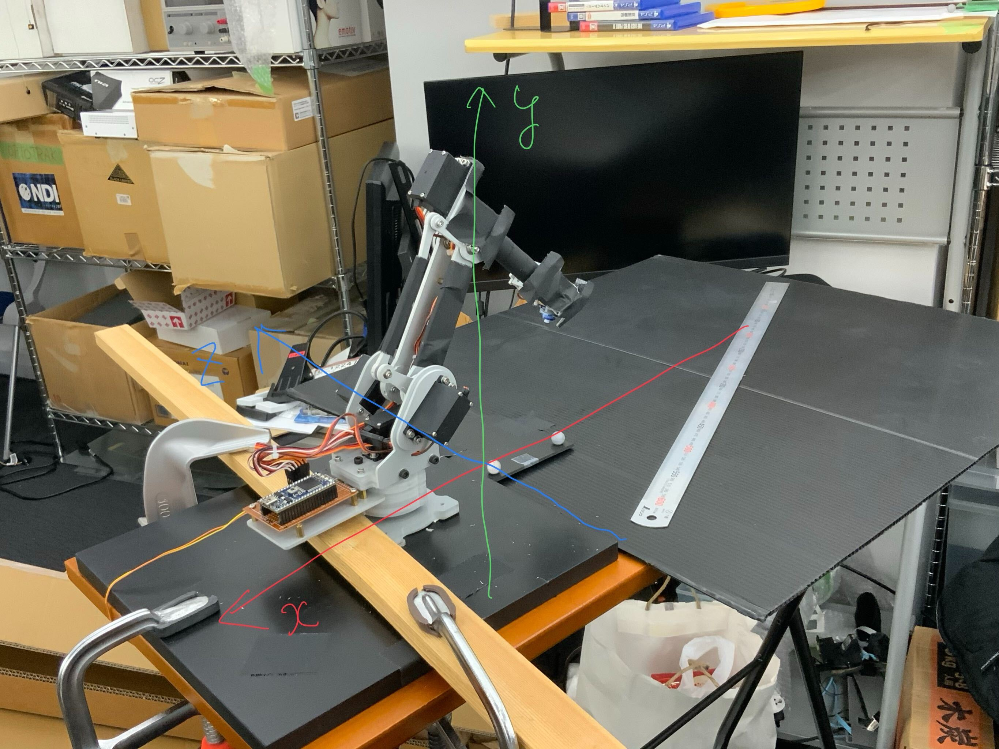

Coordination : Right Hand

Robot : +X(to Front),  +Y(to Left), +Z(to Top)

Opti : -X(to Front), +Z(to Left), +Y(to Top)

In [133]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

df =  pd.read_excel("jikkenr200fps60all.xlsx",sheet_name='jikkenr200fps60',header=0)
sw =  pd.read_excel("sweep.xlsx",header=0)

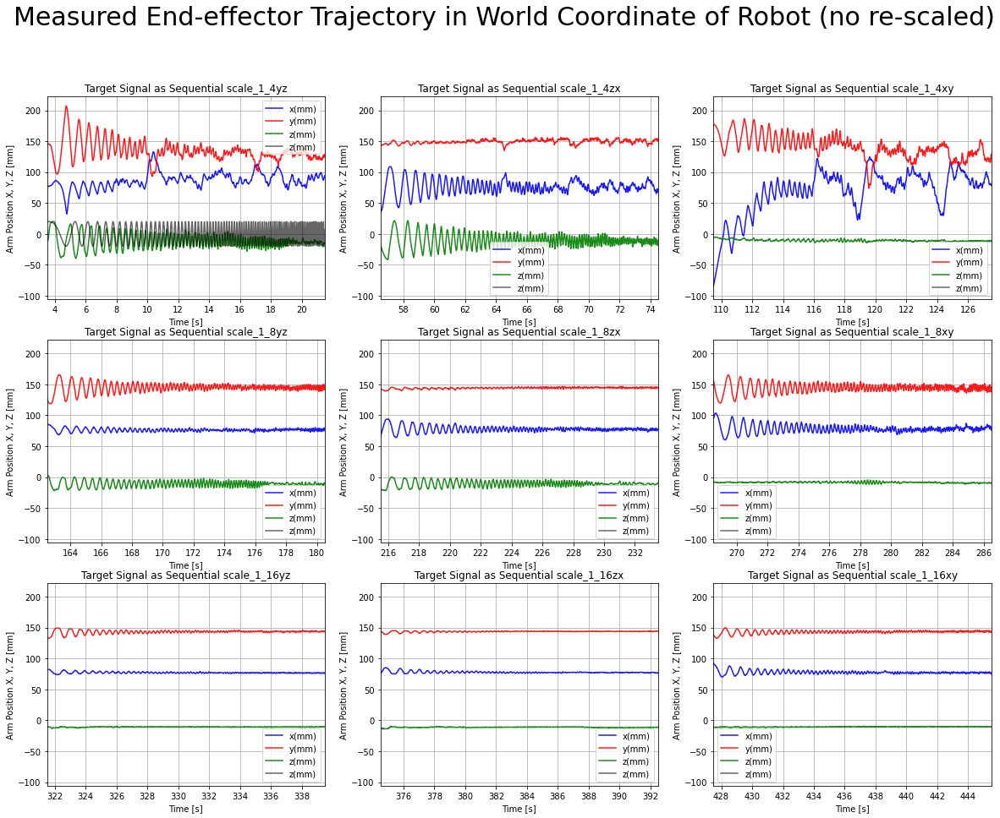

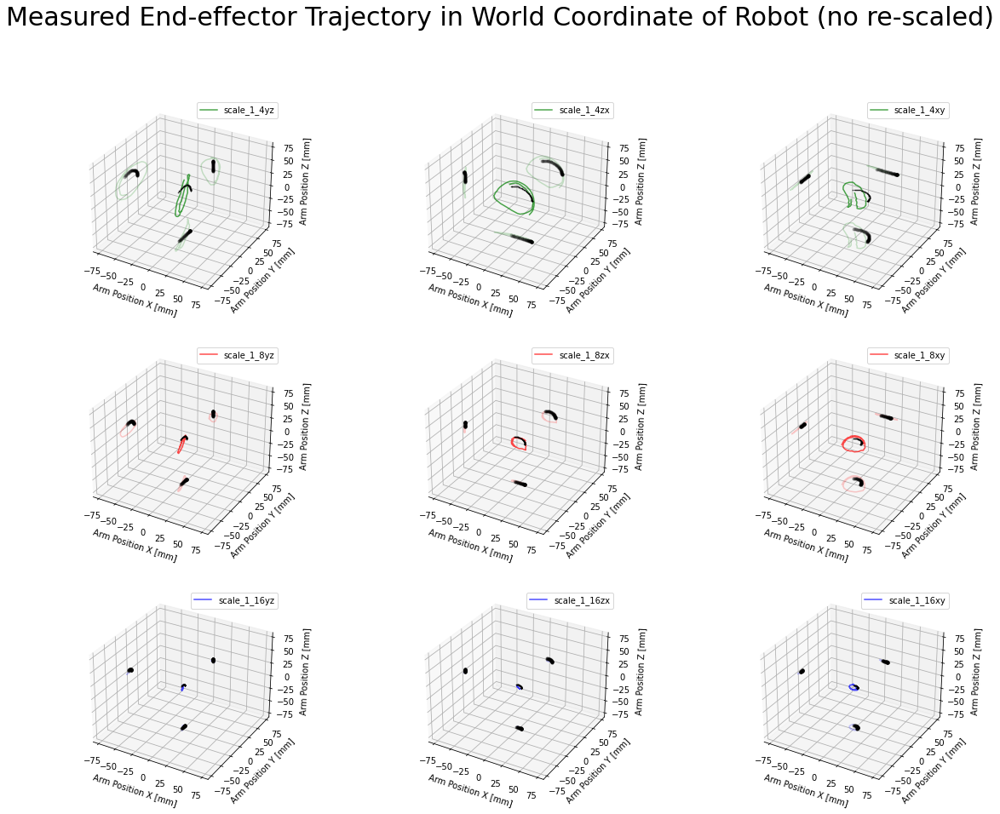

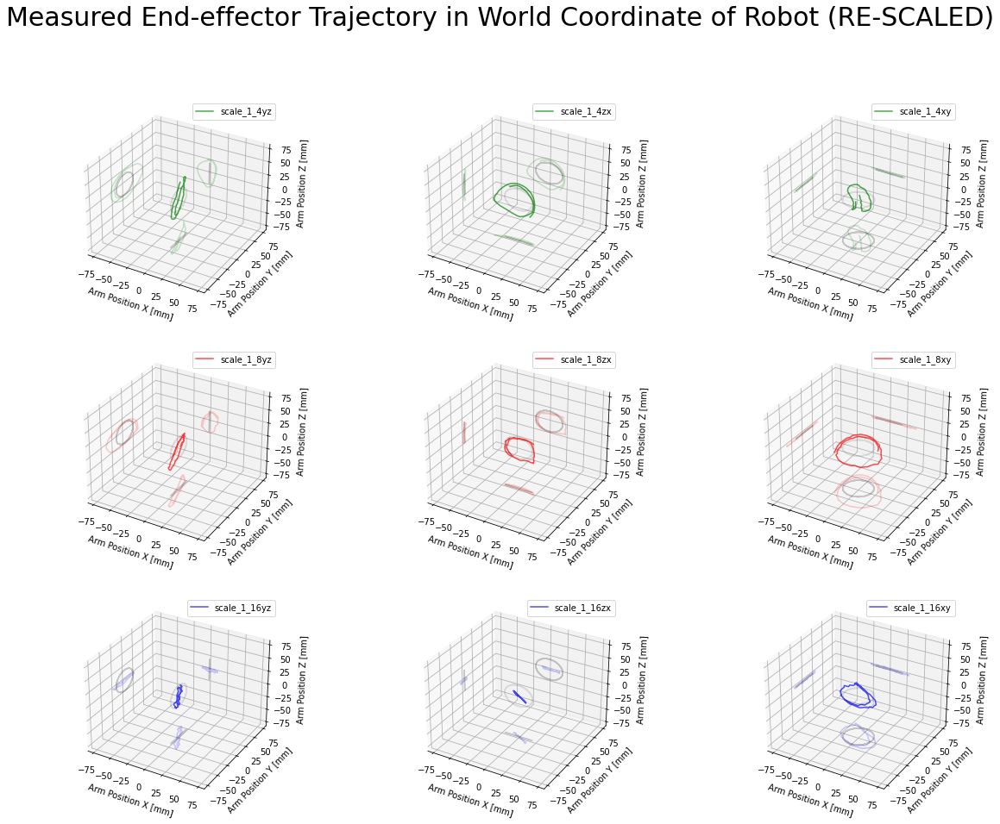

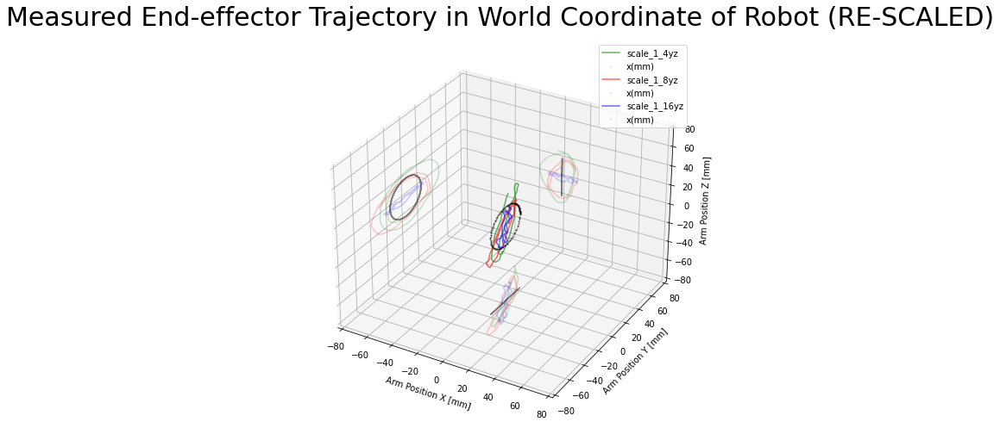

In [277]:
def setname(i):
    # implemented from 
    # https://github.com/maeda-lab/Scaledown/blob/master/simulation/simulation_realtime_Ji_sending/Source.cpp

    # Order of names created... 1/4xy,yz,zx 1/8xy,yz,zx  1/16xy,yz,zx
    # by using "if" ,"%",and "/"
    
    name = 'scale_'

    # C++ source might have bug
    # the following arrangement should be correct
    # Masahiro Furukawa
    if i % 3 == 2:
        space = "xy" 
        movespace = 0
    elif i % 3 == 0:
        space = "yz"
        movespace = 1
    else:
        space = "zx"
        movespace = 2

    if int(i / 3) == 0: 
        scalesize = "1_4"
        scale = 0.25
        c = 'g'
    elif int(i / 3) == 1:
        scalesize = "1_8"
        scale = 0.125
        c = 'r'
    else:
        scalesize = "1_16"
        scale = 0.0625
        c = 'b'

    return (name + scalesize + space , scale, c)

def Coordination_Opti2Robot(x,y,z):
    
    #    Robot : +X(to Front), +Y(to Left), +Z(to Top)
    # ** Opti : -X(to Front), +Z(to Left), +Y(to Top)
    
    return (-x, y, z)

def plot_One(key_x, key_y, key_z):
    
    fps = 60
    n = len(df['x(mm)'])
    t = np.linspace(0,n,n)/fps
    
    deltaSec = 53
    startSec  = 5
    plotSec  = 1
    
    nTrial = int(n/deltaSec/fps)
    
    fig = plt.figure(figsize=(20,15))
    fig.suptitle('Measured End-effector Trajectory in World Coordinate of Robot (no re-scaled)', fontsize=30)
        
    for s in range(nTrial):
        
        str,_,_ = setname(s)
        
        (x,y,z) = Coordination_Opti2Robot(df[key_x], df[key_y], df[key_z])
        
        plt.subplot(3,3,s+1)
        plt.plot(t, x,'b-',alpha=0.9,label = key_x, markersize=3)
        plt.plot(t, y,'r-',alpha=0.9,label = key_y, markersize=3)
        plt.plot(t, z,'g-',alpha=0.9,label = key_z, markersize=3)
        plt.plot(t[:len(sw['x'])]+3.5, sw['x'],'k-',alpha=0.6,label = key_z, markersize=3)
        plt.title('Target Signal as Sequential ' + str)
        plt.xlabel('Time [s]')
        plt.ylabel('Arm Position X, Y, Z [mm]')
#         plt.ylim([0,10])
        plt.xlim([s * deltaSec +3.5 , s * deltaSec + plotSec + startSec +15.5])
        plt.legend()
        plt.grid(True)

    
    fig = plt.figure(figsize=(20,15))
    fig.suptitle('Measured End-effector Trajectory in World Coordinate of Robot (no re-scaled)', fontsize=30)
    
    for s in range(nTrial):
        
        str, scale, c = setname(s)
        
        ss = s*deltaSec*fps + startSec*fps
        es = ss + plotSec*fps
#         es = (s+1)*deltaSec*fps
        
        x = ( df[key_x][ss:es] - np.mean(df[key_x][ss:es]) )
        y = ( df[key_y][ss:es] - np.mean(df[key_y][ss:es]) ) 
        z = ( df[key_z][ss:es] - np.mean(df[key_z][ss:es]) )
        
        (x,y,z) = Coordination_Opti2Robot(x,y,z)
        
        ax = fig.add_subplot(331+s, projection='3d')
        
        ax.plot(x, y, z, c, alpha=0.7)
        
        ax.plot(x, z, 'k-', zdir='y', zs= 80  ,alpha=0.2, c=c)
        ax.plot(y, z, 'k-', zdir='x', zs=-80  ,alpha=0.2, c=c)
        ax.plot(x, y, 'k-', zdir='z', zs=-80  ,alpha=0.2, c=c)

        sx = sw['x'][:plotSec*fps] * scale * 4.0
        sy = sw['y'][:plotSec*fps] * scale * 4.0        
        sn = np.zeros(plotSec*fps)
        
        if 'xy' in str:
            ssx = sx
            ssy = sy
            ssn = sn
            
        if 'yz' in str:
            ssx = sn
            ssy = sx
            ssn = sy

        if 'zx' in str:
            ssx = sx
            ssy = sn
            ssn = sy
        
        ax.plot(ssx, ssy, ssn, 'k.', alpha=0.9, label = key_x, markersize=1)
        
        ax.plot(ssx, ssn, 'k.', zdir='y', zs= 80  ,alpha=0.2)
        ax.plot(ssy, ssn, 'k.', zdir='x', zs=-80  ,alpha=0.2)
        ax.plot(ssx, ssy, 'k.', zdir='z', zs=-80  ,alpha=0.2)
        
        ax.set_xlabel('Arm Position X [mm]')
        ax.set_ylabel('Arm Position Y [mm]')
        ax.set_zlabel('Arm Position Z [mm]')
        ax.set_xlim([-80, 80])
        ax.set_ylim([-80, 80])
        ax.set_zlim([-80, 80])
        ax.legend([str])


    fig = plt.figure(figsize=(20,15))
    fig.suptitle('Measured End-effector Trajectory in World Coordinate of Robot (RE-SCALED)', fontsize=30)
    
    for s in range(nTrial):
        
        str, scale, c = setname(s)
        
        ss = s*deltaSec*fps + startSec*fps
        es = ss + plotSec*fps
#         es = (s+1)*deltaSec*fps
        
        x = ( df[key_x][ss:es] - np.mean(df[key_x][ss:es]) ) / scale / 4.0
        y = ( df[key_y][ss:es] - np.mean(df[key_y][ss:es]) ) / scale / 4.0
        z = ( df[key_z][ss:es] - np.mean(df[key_z][ss:es]) ) / scale / 4.0
        
        (x,y,z) = Coordination_Opti2Robot(x,y,z)
        
        ax = fig.add_subplot(331+s, projection='3d')
        
        ax.plot(x, y, z, c, alpha=0.7)
        
        ax.plot(x, z, 'k-', zdir='y', zs= 80  ,alpha=0.2, c=c)
        ax.plot(y, z, 'k-', zdir='x', zs=-80  ,alpha=0.2, c=c)
        ax.plot(x, y, 'k-', zdir='z', zs=-80  ,alpha=0.2, c=c)

#         sx = sw['x'][:]
#         sy = sw['y'][:]
#         sn = np.zeros(len(sx))

        sx = sw['x'][:200]
        sy = sw['y'][:200]  
        sn = np.zeros(200)
        
        if 'xy' in str:
            ssx = sx
            ssy = sy
            ssn = sn
            
        if 'yz' in str:
            ssx = sn
            ssy = sx
            ssn = sy

        if 'zx' in str:
            ssx = sx
            ssy = sn
            ssn = sy
        
        ax.plot(ssx, ssy, ssn, 'k-', alpha=0.1, label = key_x, markersize=2)
        
        ax.plot(ssx, ssn, 'k-', zdir='y', zs= 80  ,alpha=0.2)
        ax.plot(ssy, ssn, 'k-', zdir='x', zs=-80  ,alpha=0.2)
        ax.plot(ssx, ssy, 'k-', zdir='z', zs=-80  ,alpha=0.2)
        
        ax.set_xlabel('Arm Position X [mm]')
        ax.set_ylabel('Arm Position Y [mm]')
        ax.set_zlabel('Arm Position Z [mm]')
        ax.set_xlim([-80, 80])
        ax.set_ylim([-80, 80])
        ax.set_zlim([-80, 80])
        ax.legend([str])

    fig = plt.figure(figsize=(10,7))
    fig.suptitle('Measured End-effector Trajectory in World Coordinate of Robot (RE-SCALED)', fontsize=30)
    
    ax = fig.add_subplot(111, projection='3d')
    
    for s in [0,3,6]:
        
        str, scale, c = setname(s)
        
        ss = s*deltaSec*fps + startSec*fps
        es = ss + plotSec*fps
#         es = (s+1)*deltaSec*fps
        
        x = ( df[key_x][ss:es] - np.mean(df[key_x][ss:es]) ) / scale / 4.0
        y = ( df[key_y][ss:es] - np.mean(df[key_y][ss:es]) ) / scale / 4.0
        z = ( df[key_z][ss:es] - np.mean(df[key_z][ss:es]) ) / scale / 4.0
        
        (x,y,z) = Coordination_Opti2Robot(x,y,z)
        
        ax.plot(x, y, z, c, alpha=0.6, label=str)

        ax.plot(x, z, 'k-', zdir='y', zs= 80  ,alpha=0.2, c=c)
        ax.plot(y, z, 'k-', zdir='x', zs=-80  ,alpha=0.2, c=c)
        ax.plot(x, y, 'k-', zdir='z', zs=-80  ,alpha=0.2, c=c)

        sx = sw['x'][:200]
        sy = sw['y'][:200]  
        sn = np.zeros(200)
        
        if 'xy' in str:
            ssx = sx
            ssy = sy
            ssn = sn
            
        if 'yz' in str:
            ssx = sn
            ssy = sx
            ssn = sy

        if 'zx' in str:
            ssx = sx
            ssy = sn
            ssn = sy
        
        ax.plot(ssx, ssy, ssn, 'k.', alpha=0.1, label = key_x, markersize=2)
        
        ax.plot(ssx, ssn, 'k-', zdir='y', zs= 80  ,alpha=0.2)
        ax.plot(ssy, ssn, 'k-', zdir='x', zs=-80  ,alpha=0.2)
        ax.plot(ssx, ssy, 'k-', zdir='z', zs=-80  ,alpha=0.2)
        
        # plt.title(str)
        ax.set_xlabel('Arm Position X [mm]')
        ax.set_ylabel('Arm Position Y [mm]')
        ax.set_zlabel('Arm Position Z [mm]')
        ax.set_xlim([-80, 80])
        ax.set_ylim([-80, 80])
        ax.set_zlim([-80, 80])
        ax.legend()


    plt.tight_layout()
    plt.show()
    
plot_One('x(mm)', 'y(mm)', 'z(mm)')

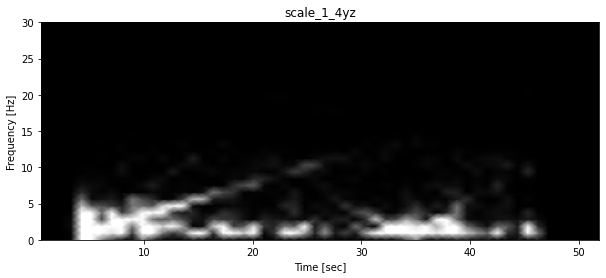

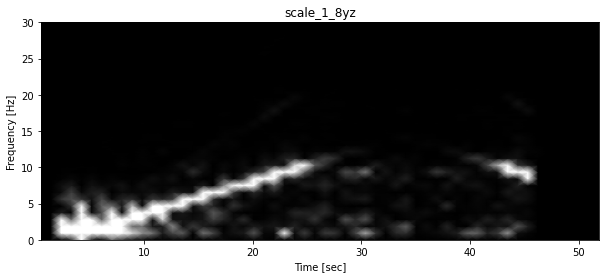

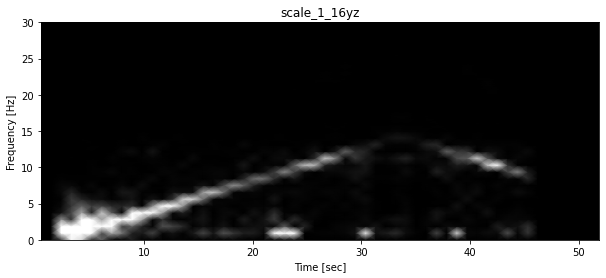

In [246]:
# Masahiro Furukawa
# Aug 31, 2020

# Spectrogram

## coding:utf-8
import os
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
from scipy import signal
from scipy import fftpack

def plot_Spec(key_x, key_y, key_z):
    
    for s in [0,3,6]:

        fps = 60
        deltaSec = 53
        

        str, scale, c = setname(s)

        ss = s*deltaSec*fps
        es = (s+1)*deltaSec*fps

        x = ( df[key_x][ss:es] - np.mean(df[key_x][ss:es]) ) / scale / 4.0
        y = ( df[key_y][ss:es] - np.mean(df[key_y][ss:es]) ) / scale / 4.0
        z = ( df[key_z][ss:es] - np.mean(df[key_z][ss:es]) ) / scale / 4.0
        
        (x,y,z) = Coordination_Opti2Robot(x,y,z)

        fig = plt.figure(figsize=(10,4))

        vmx = [1e-9, 5*1e-7]
        vmn = [1e-11, 1e-8]

        # spectrogram
        f,t_,Sxx = signal.spectrogram(y, fps, nperseg=64)
        ax = plt.gca()
        ax.pcolormesh(t_, f, Sxx,vmax=1e+1, vmin=1e-17, shading='gouraud', cmap='gray') #coolwarm jet gray 
        # ax.set_xlim([150,400])
        ax.set_ylim([0,fps/2])
        ax.set_title(str)
        ax.set_xlabel(u'Time [sec]')
        ax.set_ylabel(u'Frequency [Hz]')

plot_Spec('x(mm)', 'y(mm)', 'z(mm)')

In [253]:
print(np.power(2,12))

4096
